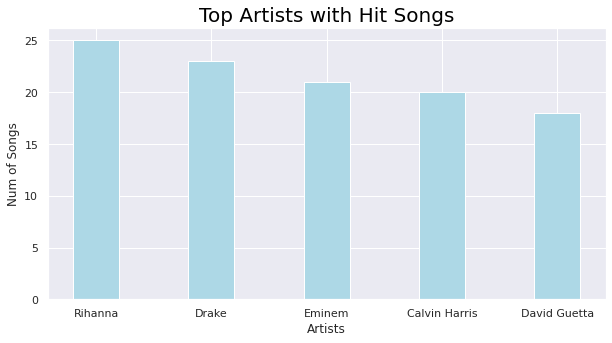

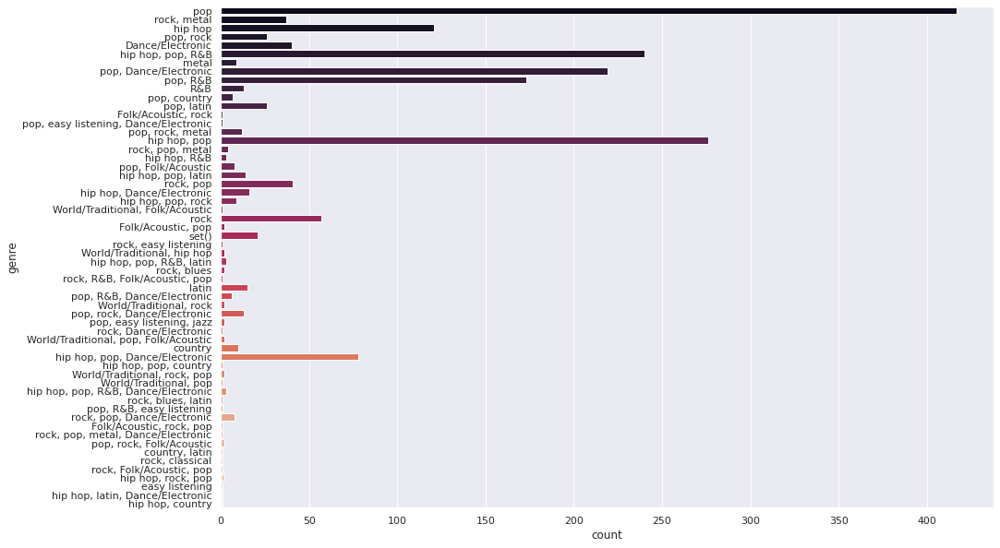

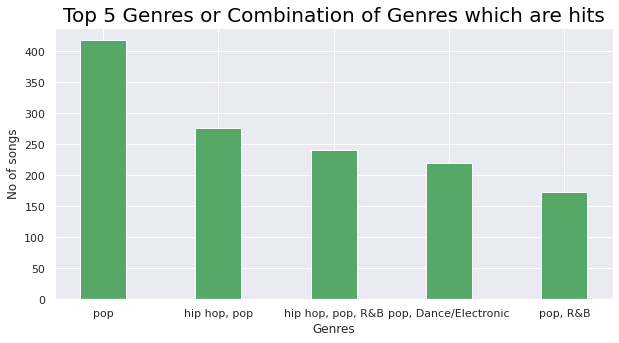

[2000 2001 2011 2002 2016 2018 2004 2010 2015 2006 2008 2019 2003 2013
 2005 2012 2020 2007 2009 2017 2014]
[2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]
0     2000
1     2001
2     2002
3     2003
4     2004
5     2005
6     2006
7     2007
8     2008
9     2009
10    2010
11    2011
12    2012
13    2013
14    2014
15    2015
16    2016
17    2017
18    2018
19    2019
20    2020
dtype: int64


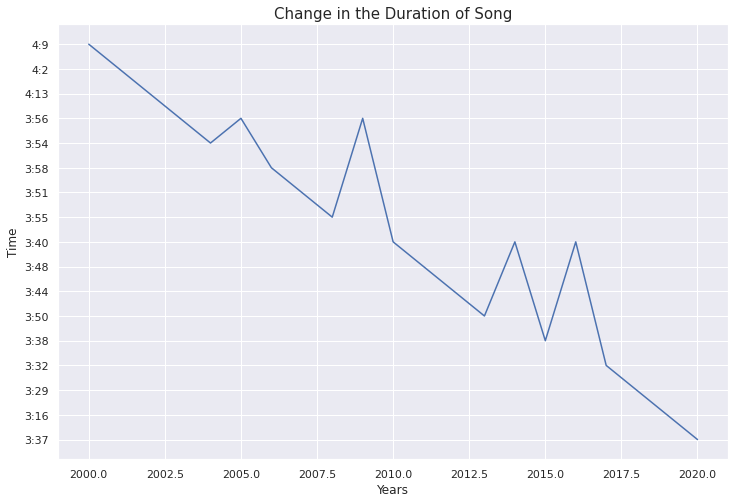

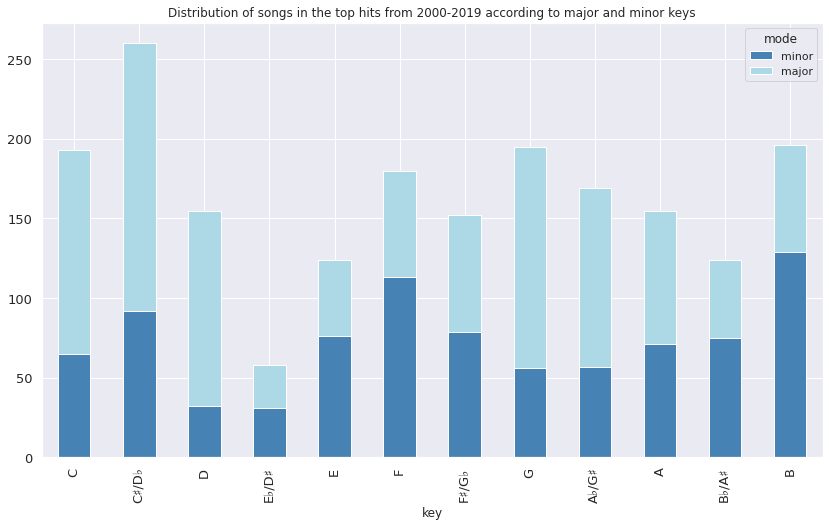

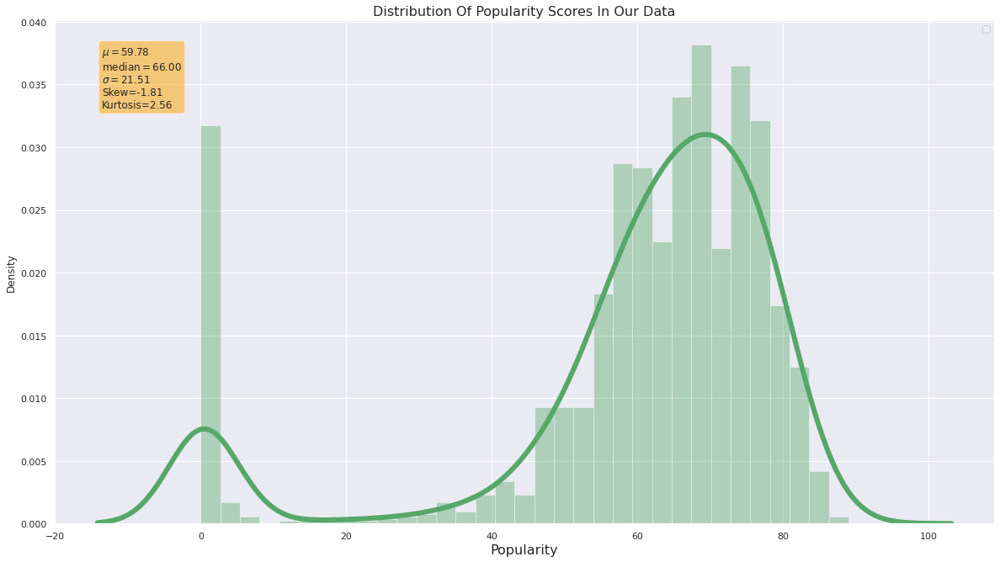

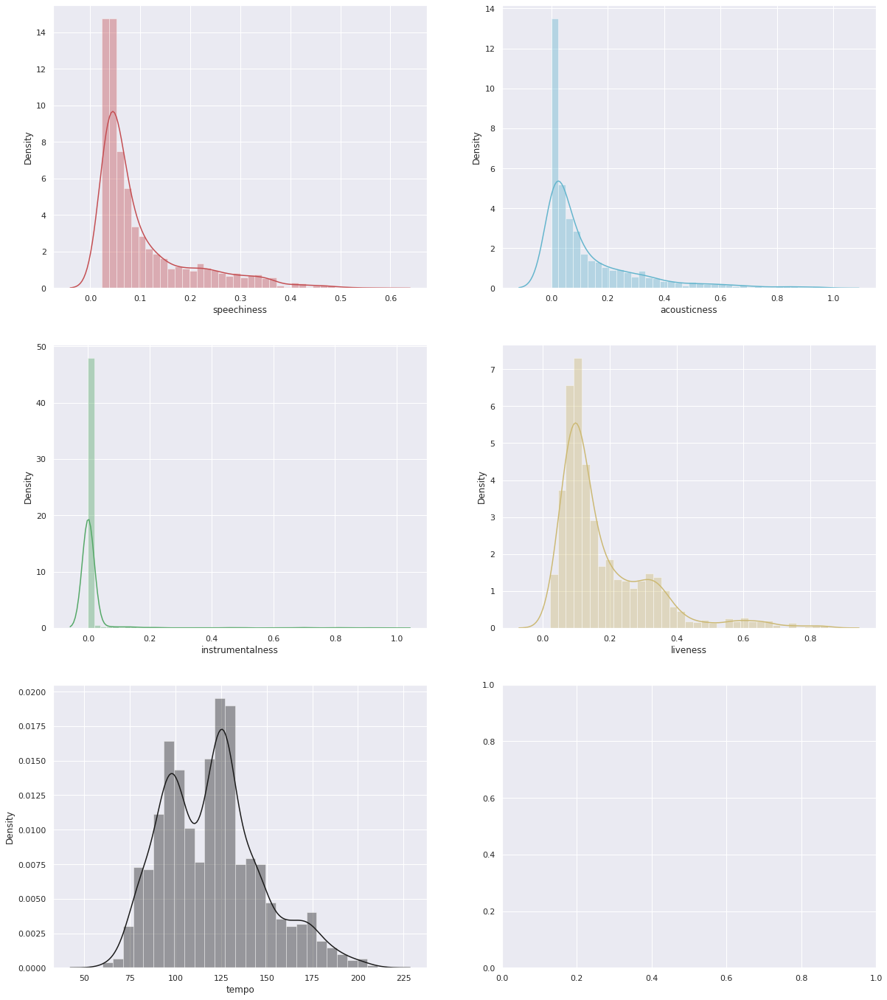

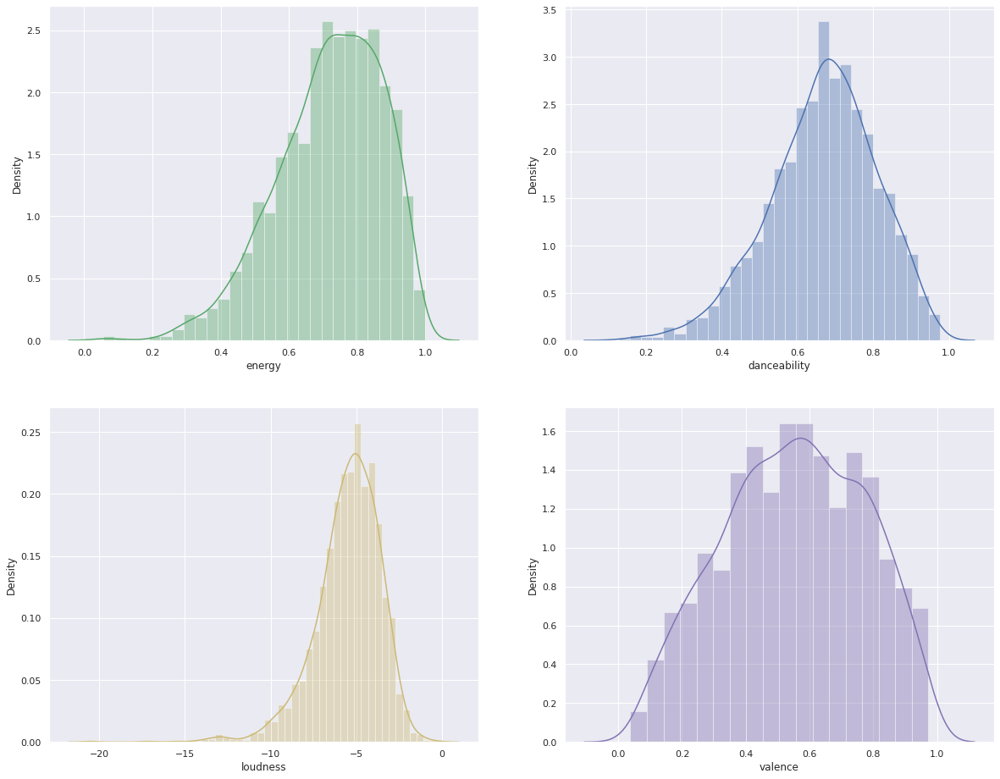

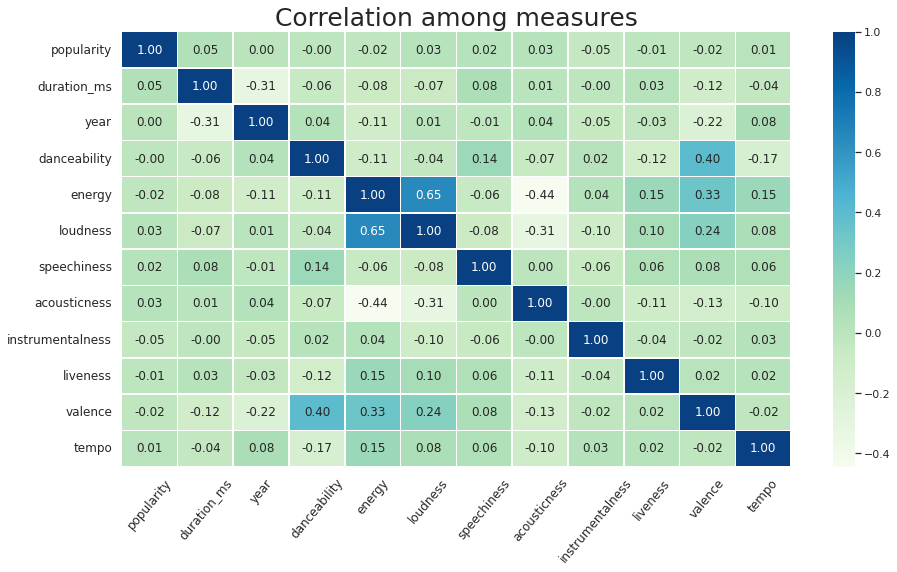

      duration_ms  loudness  acousticness  instrumentalness   valence  \
0       -0.464638  0.019909      0.995638         -0.169280  1.549074   
3       -0.126127  0.733505     -0.588016         -0.169329 -0.043117   
4       -0.733762  0.349579     -0.504117         -0.157221  1.480837   
6        1.389774  0.639978     -0.565450         -0.169489  0.939492   
7        0.738800  0.629644     -0.585701         -0.169489  1.398953   
...           ...       ...           ...               ...       ...   
1995    -1.229710  0.215747     -0.493124         -0.169489  1.812923   
1996    -1.295722 -0.115990     -0.063217         -0.169246  0.047865   
1997    -0.732924 -1.628960     -0.353100         -0.169489  1.171497   
1998    -1.483524 -1.049195      1.863553         -0.169465 -0.939293   
1999    -0.360036  1.025972      0.370740         -0.140707 -0.002175   

      speechiness    energy  
0       -0.629236  0.739930  
3       -0.599547  1.260307  
4       -0.548358  1.359112  
6  

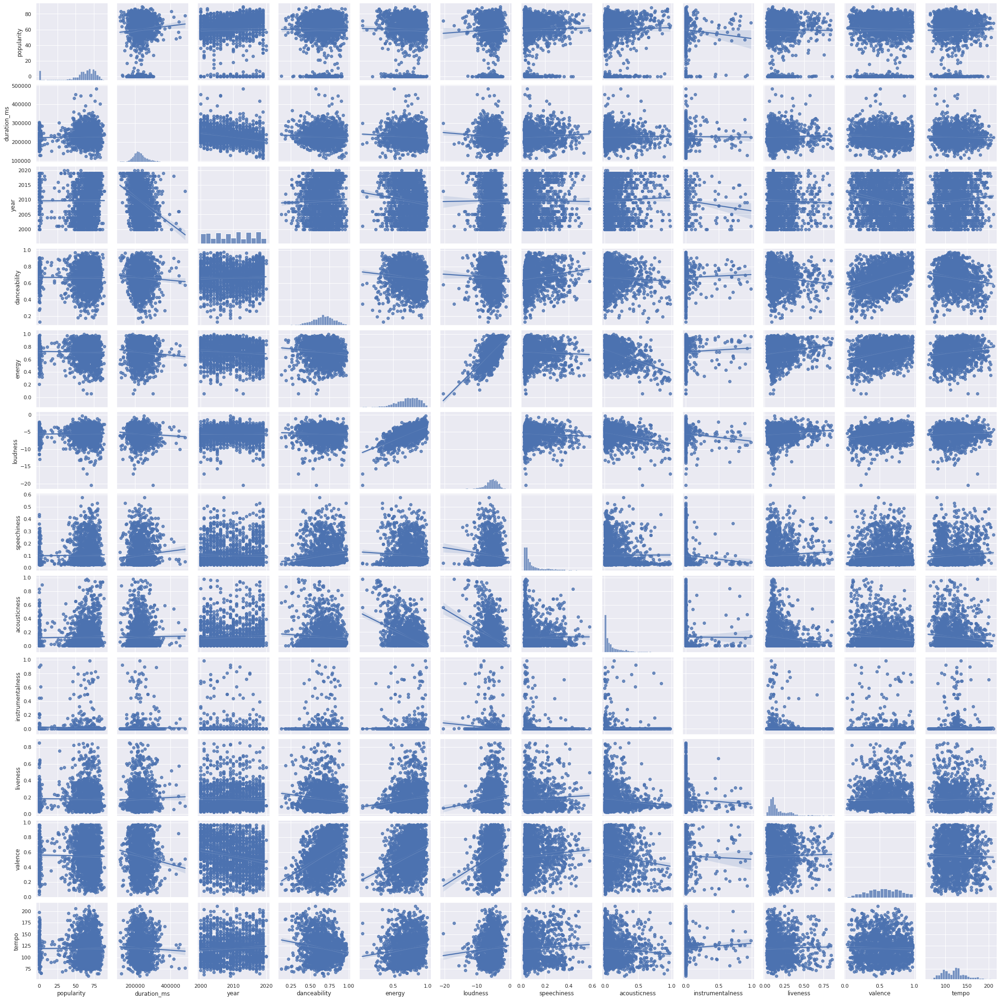

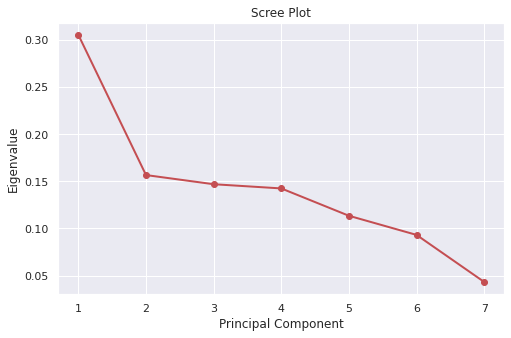

None


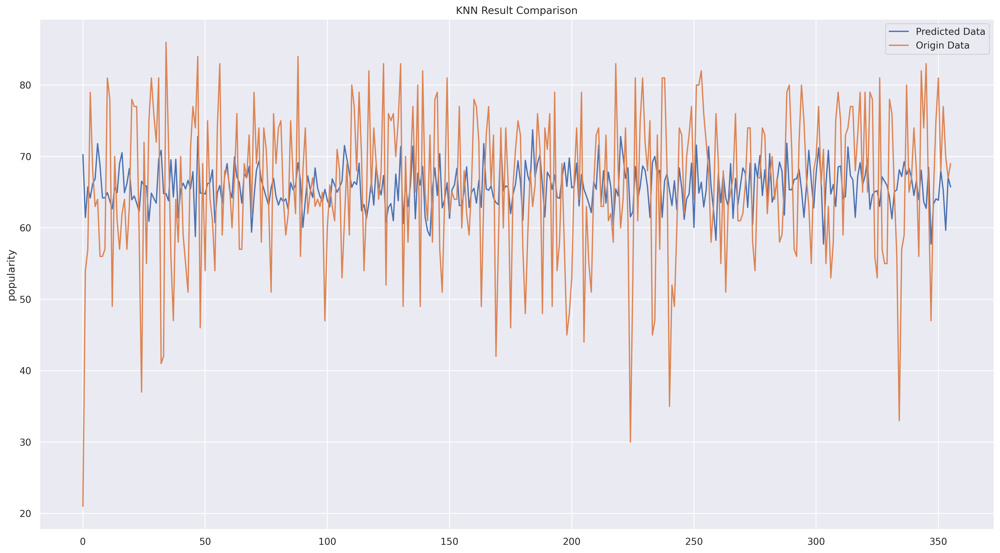

{'MSE': 112.43911360799001, 'RMSE': 10.603731117299702, 'MAE': 8.432022471910113}


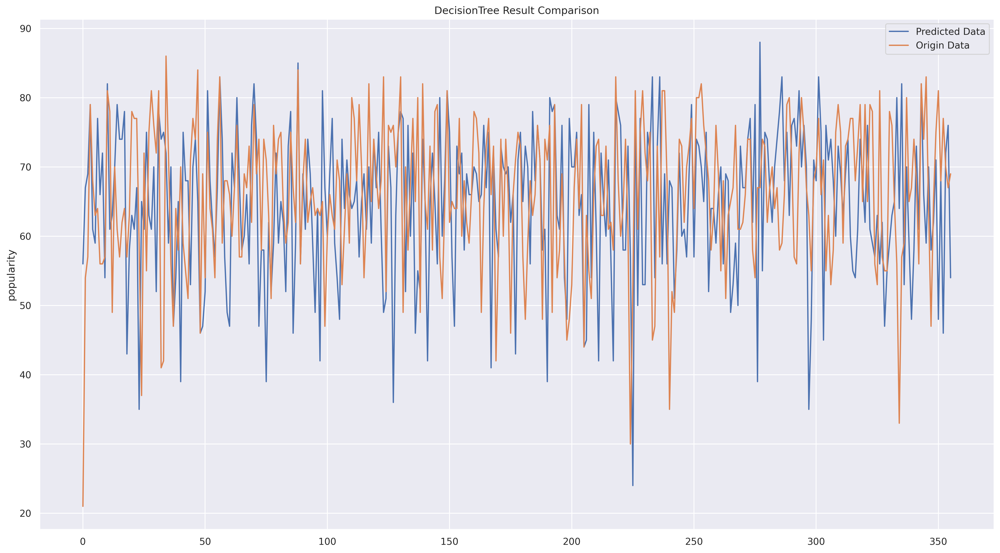

{'MSE': 198.1376404494382, 'RMSE': 14.076137270197325, 'MAE': 10.952247191011235}


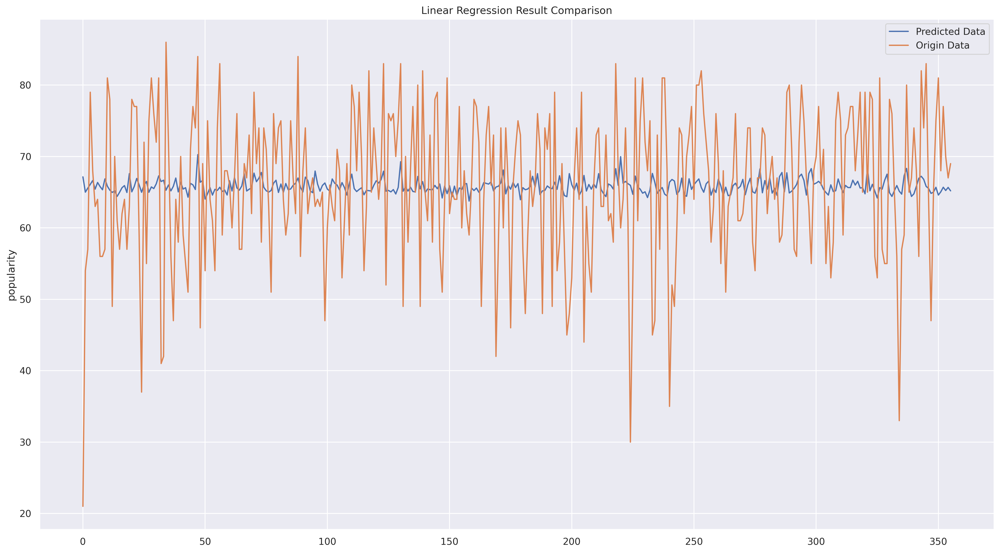

{'MSE': 107.85176448633558, 'RMSE': 10.385170412002664, 'MAE': 8.326407540908265}


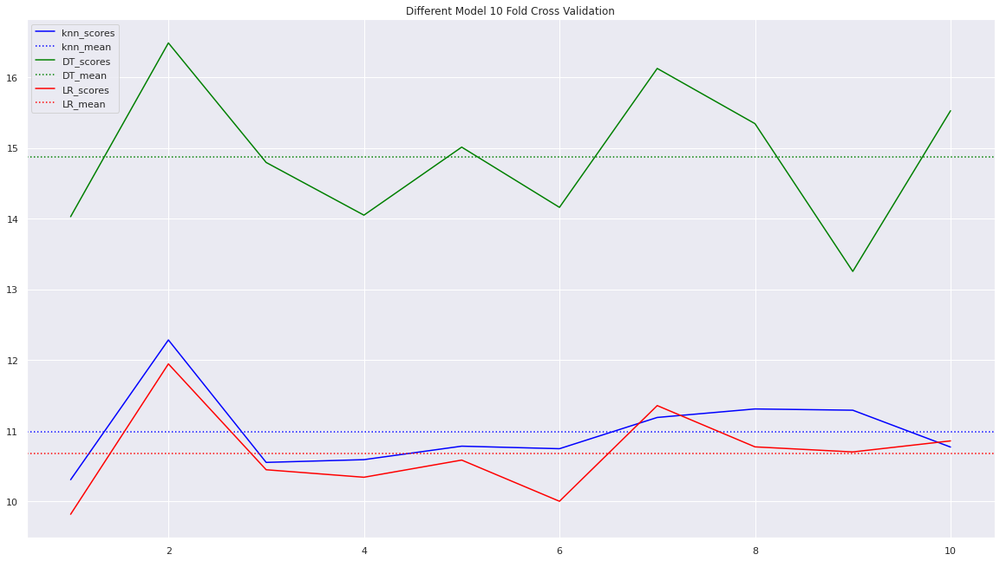

10.681170640880476 14.876416581032904 10.980311493206973


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn import preprocessing

import seaborn as sns
sns.set()
import plotly.express as ex
import plotly.graph_objs as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
pyo.init_notebook_mode()
sns.set_style('darkgrid')
import warnings
warnings.filterwarnings('ignore')
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LogisticRegression
def RMSE(y,yhat):
    return np.sqrt(mean_squared_error(y,yhat))
from nltk.sentiment.vader import SentimentIntensityAnalyzer

plt.rc('figure',figsize=(20,11))


# loading the dataset
df = pd.read_csv("/content/songs_normalize.csv")
# viewing the first 5 rows of the dataframe
df.head()
df_years_drop = df[(df['year'] <2000)].index
df = df.drop(df_years_drop)
df.drop('explicit',axis=1, inplace=True)

df.describe().T

#Artists
artist=df['artist'].value_counts()
tp_artists_songs= artist[:5]
tp_artists_name =artist[:5].index
fig = plt.figure(figsize = (10, 5))
plt.bar(tp_artists_name,tp_artists_songs,width = 0.4,color="lightblue")
plt.xlabel("Artists")
plt.ylabel("Num of Songs")
plt.title('Top Artists with Hit Songs',color = 'black',fontsize = 20)
plt.savefig('./1.jpg')
plt.show()


#genre
genre = df['genre'].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(y='genre', data=df,palette="rocket")
plt.show()

tp_genres=genre[:5]
tp_genres_names=genre[:5].index
fig = plt.figure(figsize = (10, 5))
plt.bar(tp_genres_names,tp_genres,width = 0.4,color='g')
plt.xlabel("Genres")
plt.ylabel("No of songs")
plt.title('Top 5 Genres or Combination of Genres which are hits',color = 'black',fontsize = 20)
plt.show()

#duration
def time_convert(ms):
    sec=ms/1000
    return f"{int(sec//60)}:{int(sec%60)}"
durations = df[['duration_ms','year']].groupby('year').mean().reset_index().iloc[0:21]
durations['min:sec'] = durations['duration_ms'].apply(time_convert)

x=df["year"].unique()
print(x)
x=sorted(x)
print(x)
y=(durations["min:sec"])
x=pd.Series(x)
print(x)
plt.figure(figsize=(12,8))
sns.lineplot(x,y,data=df)
plt.title('Change in the Duration of Song',fontsize=15)
plt.xlabel('Years',size=12)
plt.ylabel('Time',size=12)
plt.show()

#key
key_mode = df.groupby(['key','mode']).size().unstack(fill_value = 0).reset_index()
key_mode.rename(columns = {0: 'minor', 1: 'major'}, inplace = True)
key_mode.key.replace({0:'C',1:'C♯/D♭',2:'D',3:'E♭/D♯',4:'E',5:'F',6:'F♯/G♭',7:'G',8:'A♭/G♯',9:'A',10:'B♭/A♯',11:'B'}, inplace=True)

key_mode.plot.bar(x='key',stacked=True,color=['steelblue','lightblue'],
              title="Distribution of songs in the top hits from 2000-2019 according to major and minor keys",
              figsize=(14,8),fontsize=13)
plt.savefig('./test2.jpg')
plt.show()

#distribution
df_new = df[['popularity', 'duration_ms', 'year', 'danceability', 'energy', 
     'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']]

ax = sns.distplot(df['popularity'],hist_kws={'color':'g'},kde_kws={'color':'g','lw':'6'})
textstr = '\n'.join(
    
        (   r'$\mu=%.2f$' % (df['popularity'].mean(),)
          , r'$\mathrm{median}=%.2f$' % (df['popularity'].median(),)
          , r'$\sigma=%.2f$' % (df['popularity'].std(),)
          , r'Skew=%.2f' % (df['popularity'].skew(),)
          , r'Kurtosis=%.2f' % (df['popularity'].kurt(),)

        )
    
                  )

props = dict(boxstyle='round', facecolor='orange', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12,
        verticalalignment='top', bbox=props)
ax.set_title('Distribution Of Popularity Scores In Our Data',fontsize=16)
ax.set_xlabel('Popularity',fontsize=16)
plt.legend()
plt.show()


fig, ax = plt.subplots(3, 2, figsize=(20,24))
Speechiness= df_new['speechiness'].dropna()
sns.distplot(Speechiness,color='r',ax=ax[0][0])

Acousticness= df_new['acousticness'].dropna()
sns.distplot(Acousticness,color='c',ax=ax[0][1])

Instrumentalness = df_new['instrumentalness'].dropna()
sns.distplot(Instrumentalness,color='g',ax=ax[1][0])

Liveness= df_new['liveness'].dropna()
sns.distplot(Liveness,color='y',ax=ax[1][1])

tempo= df_new['tempo'].dropna()
sns.distplot(tempo,color='k',ax=ax[2][0])

plt.show()

fig, ax = plt.subplots(2, 2, figsize=(20,16))

sns.distplot(df_new['energy'],color="g",ax=ax[0][0])

Danceability = df_new['danceability'].dropna()
sns.distplot(Danceability,color='b',ax=ax[0][1])

Loudness= df_new['loudness'].dropna()
sns.distplot(Loudness,color='y',ax=ax[1][0])

Valence= df_new['valence'].dropna()
sns.distplot(Valence,color='m',ax=ax[1][1])

plt.show()

#correlation
plt.figure(figsize=(15,8))
sns.heatmap(df_new.corr(), annot = True, linewidths = .5, fmt = '.2f',cmap = "GnBu")
plt.title('Correlation among measures', size = 25)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12, rotation = 50)
plt.show()

sns.pairplot(df_new, kind='reg',diag_kind='hist')

#preprocess data
df_popularity_drop = df[(df['popularity'] < 20)].index
df = df.drop(df_popularity_drop)

Y = df['popularity']
X = df[['duration_ms','loudness','acousticness','instrumentalness','valence','speechiness','energy']]

#Normalization
train_mean = X.mean()
train_std = X.std()
X = (X - train_mean) / train_std

print(X)
X.describe().T

#pca
def scree(X):
    U, S, V = np.linalg.svd(X)
    eigvals = S ** 2 / np.sum(S ** 2)
    print(eigvals)
    fig = plt.figure(figsize=(8, 5))
    sing_vals = np.arange(7) + 1
    plt.plot(sing_vals, eigvals, 'ro-', linewidth=2)
    plt.title('Scree Plot')
    plt.xlabel('Principal Component')
    plt.ylabel('Eigenvalue')
    plt.show()

print(scree(X))

def get_principalComponents(num, X):
    pca = PCA(n_components=num)
    principalComponents = pca.fit_transform(X)

    return principalComponents


X = get_principalComponents(2, X)

#data split
train_X, test_X, train_y, test_y = train_test_split(X, Y, test_size=0.2)

#knn
def get_best_nneighbors(train_X, test_X, train_y, test_y):
    k_range = range(1, 100)
    k_error = []
    
    for k in k_range:
        knn = KNeighborsClassifier(n_neighbors=k)
        
        scores = cross_val_score(knn, train_X, train_y, cv=5, scoring='accuracy')
        k_error.append(1 - scores.mean())

    plt.plot(k_range[1:], k_error[1:])
    plt.xlabel('Value of K for KNN')
    plt.ylabel('Error')
    plt.show()

def KNNmodel(train_X, test_X, train_y, test_y):
    n_neighbors = 15
    for weights in ['uniform', 'distance']:

        clf = KNeighborsRegressor(n_neighbors, weights=weights)

        clf.fit(train_X, train_y)

        pred_y = clf.predict(test_X)

        x_array = range(len(test_X))
        plt.figure(dpi=300)
        plt.plot(x_array, pred_y)
        plt.plot(x_array, test_y)
        plt.title("KNN Result Comparison")
        plt.legend(["Predicted Data", "Origin Data"])
        plt.ylabel("popularity")
        plt.savefig('test1.jpg')
        plt.show()

        MSE = metrics.mean_squared_error(test_y, pred_y)
        RMSE = metrics.mean_squared_error(test_y, pred_y) ** 0.5
        MAE = metrics.mean_absolute_error(test_y, pred_y)
        results = {'MSE': MSE, 'RMSE': RMSE, 'MAE': MAE}

        break
    return results
print(KNNmodel(train_X, test_X, train_y, test_y))

# DecisionTree
def DTmodel(train_X, test_X, train_y, test_y):
    
    DT = DecisionTreeRegressor()
    DT.fit(train_X, train_y)
    pred_y = DT.predict(test_X)

    x_array = range(len(test_X))
    plt.figure(dpi=300)
    plt.plot(x_array, pred_y)
    plt.plot(x_array, test_y)
    plt.title("DecisionTree Result Comparison")
    plt.legend(["Predicted Data", "Origin Data"])
    plt.ylabel("popularity")
    plt.savefig('test1.jpg')
    plt.show()

    MSE = metrics.mean_squared_error(test_y, pred_y)
    RMSE = metrics.mean_squared_error(test_y, pred_y) ** 0.5
    MAE = metrics.mean_absolute_error(test_y, pred_y)
    results = {'MSE': MSE, 'RMSE': RMSE, 'MAE': MAE}

    return results
print(DTmodel(train_X, test_X, train_y, test_y))

#linear
def LRmodel(train_X, test_X, train_y, test_y):
    LR = LinearRegression()
    LR.fit(train_X, train_y)
    pred_y = LR.predict(test_X)

    x_array = range(len(test_X))
    plt.figure(dpi=300)
    plt.plot(x_array, pred_y)
    plt.plot(x_array, test_y)
    plt.title("Linear Regression Result Comparison")
    plt.ylabel("popularity")
    plt.legend(["Predicted Data", "Origin Data"])
    
    plt.savefig('test3.jpg')
    plt.show()

    MSE = metrics.mean_squared_error(test_y, pred_y)
    RMSE = metrics.mean_squared_error(test_y, pred_y) ** 0.5
    MAE = metrics.mean_absolute_error(test_y, pred_y)
    results = {'MSE': MSE, 'RMSE': RMSE, 'MAE': MAE}

    return results
print(LRmodel(train_X, test_X, train_y, test_y))

#k-fold cross-val
def cross_val(train_X, test_X, train_y, test_y):
    k_error = []
    # KNeighborsRegressor, KNeighborsClassifier
    knn = KNeighborsRegressor(n_neighbors=15, weights='uniform')
    DT = DecisionTreeRegressor()
    LR = LinearRegression()

    knn_scores = cross_val_score(knn, train_X, train_y, cv=10, scoring='neg_root_mean_squared_error')
    DT_scores = cross_val_score(DT, train_X, train_y, cv=10, scoring='neg_root_mean_squared_error')
    LR_scores = cross_val_score(LR, train_X, train_y, cv=10, scoring='neg_root_mean_squared_error')

    x_array = range(1, 11)

    knn_mean= np.mean(abs(knn_scores))
    DT_mean = np.mean(abs(DT_scores))
    LR_mean = np.mean(abs(LR_scores))

    plt.plot(x_array, abs(knn_scores), color='blue')
    plt.axhline(knn_mean, color='blue', linestyle=':')

    plt.plot(x_array, abs(DT_scores), color='green')
    plt.axhline(DT_mean, color='green', linestyle=':')


    plt.plot(x_array, abs(LR_scores), color='red')
    plt.axhline(LR_mean, color='red', linestyle=':')
    


    plt.legend(["knn_scores", "knn_mean", "DT_scores", "DT_mean", "LR_scores", "LR_mean"])

    plt.title("Different Model 10 Fold Cross Validation")

    plt.show()
    print(LR_mean,DT_mean,knn_mean)
cross_val(train_X, test_X, train_y, test_y)